In [1]:
# Importing the Data

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 

In [3]:
df=pd.read_csv("/home/sri-ram/DataScience/Data/IMDB Dataset.csv")

In [4]:
df.head()

,review,sentiment
0,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. <br /><br />The...,positive
2,I thought this was a wonderful way to spend ti...,positive
3,Basically there's a family where a little boy ...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is...",positive


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   review     50000 non-null  object
 1   sentiment  50000 non-null  object
dtypes: object(2)
memory usage: 781.4+ KB


In [6]:
df.sentiment.value_counts().reset_index()

,sentiment,count
0,positive,25000
1,negative,25000


In [7]:
df.sentiment.value_counts()

sentiment
positive    25000
negative    25000
Name: count, dtype: int64

In [8]:
df.shape

(50000, 2)

In [9]:
pd.DataFrame(df["sentiment"].value_counts())

,count
sentiment,
positive,25000
negative,25000


In [10]:
vc_df=pd.DataFrame(df["sentiment"].value_counts()).reset_index()

In [11]:
vc_df.columns=['Sentiment','Count']

In [12]:
vc_df['Sentiment']=vc_df['Sentiment'].map({1:'positive',0:'negative'})

In [13]:
vc_df

,Sentiment,Count
0,NaN,25000
1,NaN,25000


# Pre-Processing the data

In [14]:
'''
# Some common problems

1. Remove Punctuations
2. Replace Short words
3. Making text lower case
4. Remove stop words
5. Lemmatization
'''

'\n# Some common problems\n\n1. Remove Punctuations\n2. Replace Short words\n3. Making text lower case\n4. Remove stop words\n5. Lemmatization\n'

## 1. Remove Punctuations (.!<>{}',"(/)-)

In [15]:
df['review']

0        One of the other reviewers has mentioned that ...
1        A wonderful little production. <br /><br />The...
2        I thought this was a wonderful way to spend ti...
3        Basically there's a family where a little boy ...
4        Petter Mattei's "Love in the Time of Money" is...
                               ...                        
49995    I thought this movie did a down right good job...
49996    Bad plot, bad dialogue, bad acting, idiotic di...
49997    I am a Catholic taught in parochial elementary...
49998    I'm going to have to disagree with the previou...
49999    No one expects the Star Trek movies to be high...
Name: review, Length: 50000, dtype: object

In [16]:
#Replacing punctuations with space
df['review_processed']=df["review"].str.replace("[^A-Za-z0-9]"," ",regex=True)
df['review_processed']

0        One of the other reviewers has mentioned that ...
1        A wonderful little production   br    br   The...
2        I thought this was a wonderful way to spend ti...
3        Basically there s a family where a little boy ...
4        Petter Mattei s  Love in the Time of Money  is...
                               ...                        
49995    I thought this movie did a down right good job...
49996    Bad plot  bad dialogue  bad acting  idiotic di...
49997    I am a Catholic taught in parochial elementary...
49998    I m going to have to disagree with the previou...
49999    No one expects the Star Trek movies to be high...
Name: review_processed, Length: 50000, dtype: object

In [17]:
df=df[['review','review_processed','sentiment']]
df

,review,review_processed,sentiment
0,One of the other reviewers has mentioned that ...,One of the other reviewers has mentioned that ...,positive
1,A wonderful little production. <br /><br />The...,A wonderful little production br br The...,positive
2,I thought this was a wonderful way to spend ti...,I thought this was a wonderful way to spend ti...,positive
3,Basically there's a family where a little boy ...,Basically there s a family where a little boy ...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is...",Petter Mattei s Love in the Time of Money is...,positive
...,...,...,...
49995,I thought this movie did a down right good job...,I thought this movie did a down right good job...,positive
49996,"Bad plot, bad dialogue, bad acting, idiotic di...",Bad plot bad dialogue bad acting idiotic di...,negative
49997,I am a Catholic taught in parochial elementary...,I am a Catholic taught in parochial elementary...,negative
49998,I'm going to have to disagree with the previou...,I m going to have to disagree with the previou...,negative


## 2.Replacing short words

In [18]:
'^'.join(['this','batch','is','awsome'])

'this^batch^is^awsome'

In [19]:
df['review_processed']=df['review_processed'].apply(lambda row: ' '.join([word for word in row.split() if len(word)>2]))
df['review_processed']

0        One the other reviewers has mentioned that aft...
1        wonderful little production The filming techni...
2        thought this was wonderful way spend time too ...
3        Basically there family where little boy Jake t...
4        Petter Mattei Love the Time Money visually stu...
                               ...                        
49995    thought this movie did down right good job was...
49996    Bad plot bad dialogue bad acting idiotic direc...
49997    Catholic taught parochial elementary schools n...
49998    going have disagree with the previous comment ...
49999    one expects the Star Trek movies high art but ...
Name: review_processed, Length: 50000, dtype: object

## 3.Making text lower case

In [20]:
'koushik'=='Koushik'

False

In [21]:
word='Koushik'
word.lower()

'koushik'

In [22]:
df['review_processed']=[row.lower() for row in df['review_processed']]

In [23]:
df['review_processed']

0        one the other reviewers has mentioned that aft...
1        wonderful little production the filming techni...
2        thought this was wonderful way spend time too ...
3        basically there family where little boy jake t...
4        petter mattei love the time money visually stu...
                               ...                        
49995    thought this movie did down right good job was...
49996    bad plot bad dialogue bad acting idiotic direc...
49997    catholic taught parochial elementary schools n...
49998    going have disagree with the previous comment ...
49999    one expects the star trek movies high art but ...
Name: review_processed, Length: 50000, dtype: object

## 4.Remove Stop Words

In [24]:
import nltk
nltk.download('punkt')
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk import word_tokenize

[nltk_data] Downloading package punkt to /home/sri-ram/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /home/sri-
[nltk_data]     ram/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [25]:
stop_words=stopwords.words('english')
#custome list
add_words=['movie','film','one','make','even','like','see','movies','get','makes','making']
stop_words.extend(add_words)

In [26]:
len(stop_words)

190

In [27]:
#Function to remove stopwords

def remove_stopwords(rev):
    rev_tokenized=word_tokenize(rev)
    rev_new=' '.join([word for word in rev_tokenized if word not in stop_words])
    return rev_new

In [28]:
df['review_processed']=[remove_stopwords(row) for row in df['review_processed']]

In [29]:
df['review_processed']

0        reviewers mentioned watching episode hooked ri...
1        wonderful little production filming technique ...
2        thought wonderful way spend time hot summer we...
3        basically family little boy jake thinks zombie...
4        petter mattei love time money visually stunnin...
                               ...                        
49995    thought right good job creative original first...
49996    bad plot bad dialogue bad acting idiotic direc...
49997    catholic taught parochial elementary schools n...
49998    going disagree previous comment side maltin se...
49999    expects star trek high art fans expect good be...
Name: review_processed, Length: 50000, dtype: object

## 5. Lemmatization

In [30]:
nltk.download('wordnet')
nltk.download('omw-1.4')
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet

[nltk_data] Downloading package wordnet to /home/sri-ram/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /home/sri-ram/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [35]:
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /home/sri-ram/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


True

In [36]:
# Function to convert nltk tag to wordnet tag
lemmatizer=WordNetLemmatizer()

In [37]:
# Functin to convert detailed POS tag to shallow POS tag
def nltk_tag_to_wordnet_tag(nltk_tag):
    if nltk_tag.startswith('J'):
        return wordnet.ADJ
    elif nltk_tag.startswith('V'):
        return wordnet.VERB
    elif nltk_tag.startswith('N'):
        return wordnet.NOUN
    elif nltk_tag.startswith('R'):
        return wordnet.ADV
    else:
        return None

In [38]:
# Function to Lemmatize sentence using POS tag
def lemmatize_sentence(sentence):
    # word tokenize --> pos tag(detailed)--> wordnet pos tag(shallow)--> lemmatizer-->root word
    nltk_tagged=nltk.pos_tag(nltk.word_tokenize(sentence))
    wordnet_tagged=map(lambda x: (x[0],nltk_tag_to_wordnet_tag(x[1])),nltk_tagged)
    lemmatized_sentence=[]
    
    for word,tag in wordnet_tagged:
        if tag is None:
            lemmatized_sentence.append(word)
        else:
            lemmatized_sentence.append(lemmatizer.lemmatize(word,tag))
    return " ".join(lemmatized_sentence)

In [39]:
df['review_processed']=df['review_processed'].apply(lambda x: lemmatize_sentence(x))

In [40]:
df['review_processed']

0        reviewer mention watch episode hook right exac...
1        wonderful little production film technique una...
2        think wonderful way spend time hot summer week...
3        basically family little boy jake think zombie ...
4        petter mattei love time money visually stunnin...
                               ...                        
49995    thought right good job creative original first...
49996    bad plot bad dialogue bad act idiotic direct a...
49997    catholic teach parochial elementary school nun...
49998    go disagree previous comment side maltin secon...
49999    expect star trek high art fan expect good best...
Name: review_processed, Length: 50000, dtype: object

In [41]:
#Example
nltk_tagged=nltk.pos_tag(nltk.word_tokenize("this batch is awesome"))
nltk_tagged

[('this', 'DT'), ('batch', 'NN'), ('is', 'VBZ'), ('awesome', 'JJ')]

# Plotting Frequent Words

In [42]:
df

,review,review_processed,sentiment
0,One of the other reviewers has mentioned that ...,reviewer mention watch episode hook right exac...,positive
1,A wonderful little production. <br /><br />The...,wonderful little production film technique una...,positive
2,I thought this was a wonderful way to spend ti...,think wonderful way spend time hot summer week...,positive
3,Basically there's a family where a little boy ...,basically family little boy jake think zombie ...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is...",petter mattei love time money visually stunnin...,positive
...,...,...,...
49995,I thought this movie did a down right good job...,thought right good job creative original first...,positive
49996,"Bad plot, bad dialogue, bad acting, idiotic di...",bad plot bad dialogue bad act idiotic direct a...,negative
49997,I am a Catholic taught in parochial elementary...,catholic teach parochial elementary school nun...,negative
49998,I'm going to have to disagree with the previou...,go disagree previous comment side maltin secon...,negative


In [43]:
# Distribution plot
# Plotting most frequent words from positive reviews using bar chart

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='white')
from nltk import FreqDist  #function to find the frequent words in the data

all_words_df=df.loc[df['sentiment']=='positive',:]

# Extracts words into list and count frequency
all_words=' '.join([text for text in all_words_df['review_processed']])
all_words=all_words.split()
words_df=FreqDist(all_words)

words_df

FreqDist({'good': 16542, 'time': 16434, 'well': 15856, 'great': 14330, 'story': 14163, 'character': 14028, 'watch': 12395, 'show': 12103, 'love': 11642, 'think': 10799, ...})

In [44]:
# Extracting words and frequency from words_df object

words_df=pd.DataFrame({'word':list(words_df.keys()),'count':list(words_df.values())})
words_df

,word,count
0,reviewer,431
1,mention,1286
2,watch,12395
3,episode,2843
4,hook,291
...,...,...
65551,antwones,1
65552,censorial,1
65553,burtolucci,1
65554,jossi,1


In [46]:
words_df=words_df.nlargest(columns='count',n=30) #Subsets top 30 words by frequency
words_df

,word,count
311,good,16542
136,time,16434
109,well,15856
167,great,14330
333,story,14163
209,character,14028
2,watch,12395
18,show,12103
229,love,11642
194,think,10799


In [47]:
words_df.sort_values('count',inplace=True)

In [48]:
words_df

,word,count
172,come,8408
305,find,8465
132,film,8485
303,best,8524
73,say,8581
32,give,8620
268,people,8833
195,way,8863
170,life,8933
294,take,9006


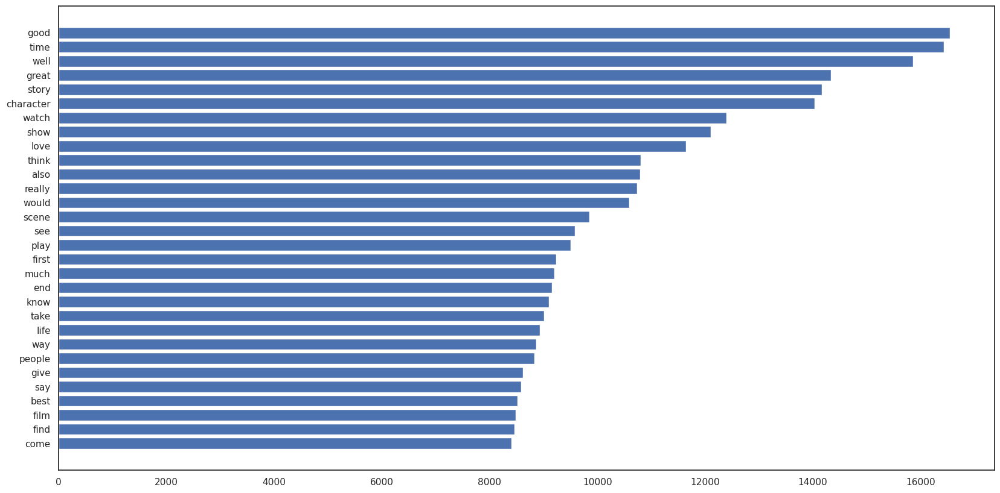

In [51]:
# Plotting 30 frequent words

plt.figure(figsize=(20,10))
ax=plt.barh(words_df["word"],width=words_df['count'])
plt.show()

# WordCloud

In [54]:
!pip install wordcloud

  Obtaining dependency information for wordcloud from https://files.pythonhosted.org/packages/22/8c/18556cbe48b6d2e03d6bb1001ef79b9255c767d2927addcf090b700a1de9/wordcloud-1.9.2-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 473.1/473.1 kB 5.6 MB/s eta 0:00:005.8 MB/s eta 0:00:01


In [55]:
from wordcloud import WordCloud
word_cloud_df=df.loc[df['sentiment']=='positive',:]
[text for text in word_cloud_df['review_processed']]

['reviewer mention watch episode hook right exactly happen first thing struck brutality unflinching scene violence set right word trust show faint hearted timid show pull punch regard drug sex violence hardcore classic use word call nickname give oswald maximum security state penitentary focus mainly emerald city experimental section prison cell glass front face inwards privacy high agenda city home many aryan muslim gangstas latinos christian italian irish scuffle death stare dodgy dealing shady agreement never far away would say main appeal show due fact go show dare forget pretty picture paint mainstream audience forget charm forget romance mess around first episode ever saw struck nasty surreal say ready watch developed taste get accustomed high level graphic violence violence injustice crook guard sell nickel inmate kill order away well mannered middle class inmate turn prison bitch due lack street skill prison experience watching may become comfortable uncomfortable view thats to

In [56]:
all_words=" ".join([text for text in word_cloud_df['review_processed']])
all_words

'reviewer mention watch episode hook right exactly happen first thing struck brutality unflinching scene violence set right word trust show faint hearted timid show pull punch regard drug sex violence hardcore classic use word call nickname give oswald maximum security state penitentary focus mainly emerald city experimental section prison cell glass front face inwards privacy high agenda city home many aryan muslim gangstas latinos christian italian irish scuffle death stare dodgy dealing shady agreement never far away would say main appeal show due fact go show dare forget pretty picture paint mainstream audience forget charm forget romance mess around first episode ever saw struck nasty surreal say ready watch developed taste get accustomed high level graphic violence violence injustice crook guard sell nickel inmate kill order away well mannered middle class inmate turn prison bitch due lack street skill prison experience watching may become comfortable uncomfortable view thats tou

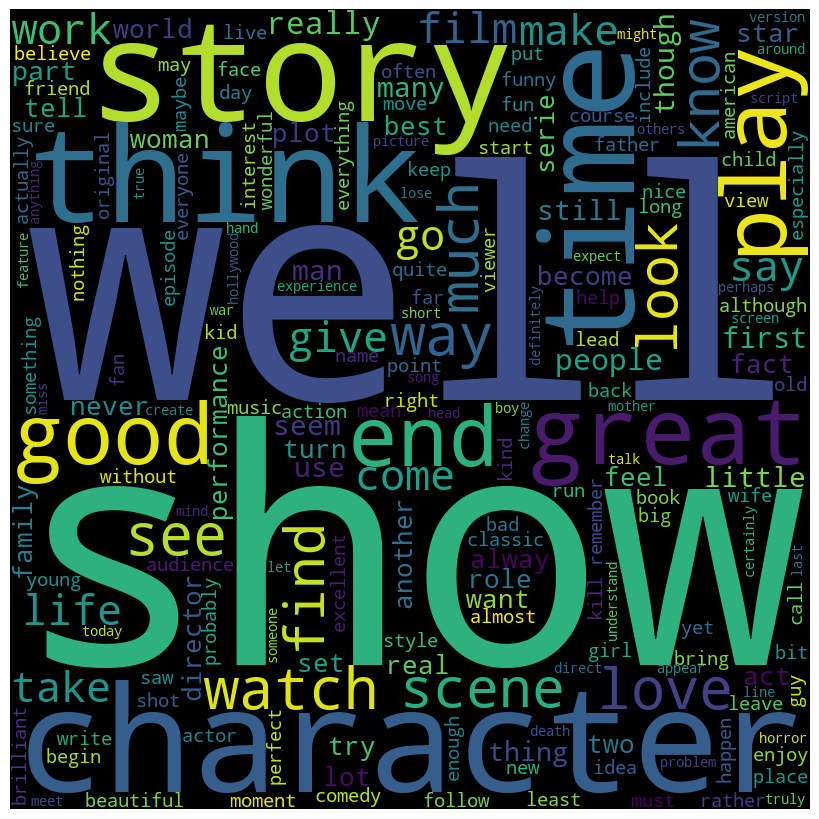

In [58]:
# Building a word cloud
wordcloud=WordCloud(width=800,height=800,
                   background_color='black',
                   min_font_size=10).generate(all_words)

# Plot the word cloud image
plt.figure(figsize=(8,8),facecolor=None)
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

##  Bag of Words model

In [62]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Creating matrix of top 2500 tokens
tfidf=TfidfVectorizer(max_features=2500) # One-Gram approach
temp_df=tfidf.fit_transform(df.review_processed)
feature_names=tfidf.get_feature_names_out()
pd.DataFrame(temp_df.toarray(),columns=feature_names)

,000,100,1950,1970,1980,2001,70s,80s,abandon,ability,...,yeah,year,yell,yes,yet,york,young,youth,zero,zombie
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.000000
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.000000
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.065745,0.0,0.0,0.0,0.00000,0.07827,0.0,0.0,0.000000
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.315985
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.11881,0.00000,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.000000
49996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.000000
49997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.000000
49998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.0,0.00000,0.00000,0.0,0.0,0.000000


In [63]:
""""
# Creating matrix of top 2500 tokens # Bi-Gram approach
tfidf=TfidfVectorizer(ngram_range=(2,2),max_features=2500) # Bi-Gram approach
temp_df=tfidf.fit_transform(df.review_processed)
feature_names=tfidf.get_feature_names_out()
pd.DataFrame(temp_df.toarray(),columns=feature_names)
"""""

,19th century,20th century,21st century,absolutely love,absolutely nothing,academy award,act ability,act also,act awful,act bad,...,young child,young girl,young kid,young lady,young man,young men,young people,young son,young woman,zeta jones
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.293712,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
49996,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
49997,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
49998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0


In [64]:
tfidf=TfidfVectorizer(max_features=2500)
X=tfidf.fit_transform(df.review_processed).toarray()
y=df.sentiment.map({'positive':1,'negative':0}).values
feature_names=tfidf.get_feature_names_out()
X,y

(array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]),
 array([1, 1, 1, ..., 0, 0, 0]))

In [65]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2)

In [66]:
X_train.shape,X_test.shape

((40000, 2500), (10000, 2500))

In [67]:
X_train

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

## Building the ML Model

In [69]:
from sklearn.tree import DecisionTreeClassifier

dt=DecisionTreeClassifier()
dt.fit(X_train,y_train)

y_pred=dt.predict(X_test)
y_pred

array([1, 1, 0, ..., 0, 0, 0])

In [70]:
from sklearn.metrics import accuracy_score,confusion_matrix

accuracy=accuracy_score(y_test,y_pred)
cm=confusion_matrix(y_test,y_pred)
print(cm)
print('The model accuracy is:',accuracy)

[[3547 1471]
 [1397 3585]]
The model accuracy is: 0.7132


In [71]:
from sklearn.metrics import roc_auc_score
roc_auc_score(y_test,dt.predict_proba(X_test)[:,1])

0.7132229233690869

In [72]:
# Heat Map

In [73]:
# Feature Importance